
## Overview

This notebook will show you how to create and query a table or DataFrame that you uploaded to DBFS. [DBFS](https://docs.databricks.com/user-guide/dbfs-databricks-file-system.html) is a Databricks File System that allows you to store data for querying inside of Databricks. This notebook assumes that you have a file already inside of DBFS that you would like to read from.

This notebook is written in **Python** so the default cell type is Python. However, you can use different languages by using the `%LANGUAGE` syntax. Python, Scala, SQL, and R are all supported.

In [0]:
# File location and type
file_location = "/FileStore/tables/landing/Transações-1.csv"
file_type = "csv"

# CSV options
infer_schema = "True"
first_row_is_header = "True"
delimiter = ";"

# The applied options are for CSV files. For other file types, these will be ignored.
df_t = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df_t)

ID_Trans,Data,ID_Loja,ID_Produto,ID_Cliente,UnidadesVendidas,ValorTotal,Promo
1,2022-01-01,7,123005,90023,2,"R$ 99,98",0
2,2022-01-01,9,123004,90092,1,"R$ 35,99",0
3,2022-01-01,1,123001,90027,2,"R$ 51,98",0
4,2022-01-01,3,123001,90097,2,"R$ 51,98",0
5,2022-01-01,4,123004,90089,2,"R$ 71,98",0
6,2022-01-02,4,123006,90021,3,"R$ 151,17",1
7,2022-01-02,9,123005,90072,4,"R$ 199,96",0
8,2022-01-02,1,123002,90006,3,"R$ 83,97",0
9,2022-01-03,6,123002,90006,2,"R$ 55,98",0
10,2022-01-03,3,123002,90069,1,"R$ 25,19",null


In [0]:
df_t.printSchema()

root
 |-- ID_Trans: integer (nullable = true)
 |-- Data: date (nullable = true)
 |-- ID_Loja: integer (nullable = true)
 |-- ID_Produto: integer (nullable = true)
 |-- ID_Cliente: integer (nullable = true)
 |-- UnidadesVendidas: integer (nullable = true)
 |-- ValorTotal: string (nullable = true)
 |-- Promo: integer (nullable = true)



In [0]:
from pyspark.sql.functions import col, regexp_replace, translate

# Remove 'R$', replace comma with dot, and convert the column to float
df_t = df_t.withColumn('ValorTotal', translate(regexp_replace(col('ValorTotal'), '[^0-9,]', ''), ',', '.').cast('float'))

# Print the schema to verify the changes
df_t.printSchema()

root
 |-- ID_Trans: integer (nullable = true)
 |-- Data: date (nullable = true)
 |-- ID_Loja: integer (nullable = true)
 |-- ID_Produto: integer (nullable = true)
 |-- ID_Cliente: integer (nullable = true)
 |-- UnidadesVendidas: integer (nullable = true)
 |-- ValorTotal: float (nullable = true)
 |-- Promo: integer (nullable = true)



In [0]:
display(df_t)

ID_Trans,Data,ID_Loja,ID_Produto,ID_Cliente,UnidadesVendidas,ValorTotal,Promo
1,2022-01-01,7,123005,90023,2,99.98,0
2,2022-01-01,9,123004,90092,1,35.99,0
3,2022-01-01,1,123001,90027,2,51.98,0
4,2022-01-01,3,123001,90097,2,51.98,0
5,2022-01-01,4,123004,90089,2,71.98,0
6,2022-01-02,4,123006,90021,3,151.17,1
7,2022-01-02,9,123005,90072,4,199.96,0
8,2022-01-02,1,123002,90006,3,83.97,0
9,2022-01-03,6,123002,90006,2,55.98,0
10,2022-01-03,3,123002,90069,1,25.19,null


In [0]:
# # Create a view or table

# temp_table_name = "Transações-1_csv"

# df.createOrReplaceTempView(temp_table_name)

In [0]:
# %sql

# /* Query the created temp table in a SQL cell */

# select * from `Transações-1_csv`

In [0]:
# # With this registered as a temp view, it will only be available to this particular notebook. If you'd like other users to be able to query this table, you can also create a table from the DataFrame.
# # Once saved, this table will persist across cluster restarts as well as allow various users across different notebooks to query this data.
# # To do so, choose your table name and uncomment the bottom line.

# permanent_table_name = "Transações-1_csv"

# # df.write.format("parquet").saveAsTable(permanent_table_name)

In [0]:
pastel2 = ['#b3e2cd', '#fdcdac', '#cbd5e8', '#f4cae4', '#e6f5c9', '#fff2ae', '#f1e2cc', '#cccccc']

In [0]:
from pyspark.sql.functions import year, month

df_t = df_t.withColumn('Year', year(df_t['Data']))
df_t = df_t.withColumn('Month', month(df_t['Data']))

In [0]:
# Print the schema to verify the changes
df_t.printSchema()

root
 |-- ID_Trans: integer (nullable = true)
 |-- Data: date (nullable = true)
 |-- ID_Loja: integer (nullable = true)
 |-- ID_Produto: integer (nullable = true)
 |-- ID_Cliente: integer (nullable = true)
 |-- UnidadesVendidas: integer (nullable = true)
 |-- ValorTotal: float (nullable = true)
 |-- Promo: integer (nullable = true)
 |-- Year: integer (nullable = true)
 |-- Month: integer (nullable = true)



In [0]:
display(df_t)

ID_Trans,Data,ID_Loja,ID_Produto,ID_Cliente,UnidadesVendidas,ValorTotal,Promo,Year,Month
1,2022-01-01,7,123005,90023,2,99.98,0,2022,1
2,2022-01-01,9,123004,90092,1,35.99,0,2022,1
3,2022-01-01,1,123001,90027,2,51.98,0,2022,1
4,2022-01-01,3,123001,90097,2,51.98,0,2022,1
5,2022-01-01,4,123004,90089,2,71.98,0,2022,1
6,2022-01-02,4,123006,90021,3,151.17,1,2022,1
7,2022-01-02,9,123005,90072,4,199.96,0,2022,1
8,2022-01-02,1,123002,90006,3,83.97,0,2022,1
9,2022-01-03,6,123002,90006,2,55.98,0,2022,1
10,2022-01-03,3,123002,90069,1,25.19,null,2022,1


In [0]:
from pyspark.sql import functions as F

grouped = df_t.groupBy('Year', 'Month').agg(F.sum('ValorTotal').alias('ValorTotal'), 
                                             F.sum('UnidadesVendidas').alias('UnidadesVendidas'))
# Agrupando os dados por ano e mês
grouped.show()

+----+-----+------------------+----------------+
|Year|Month|        ValorTotal|UnidadesVendidas|
+----+-----+------------------+----------------+
|2023|    8|  53043.2001991272|             968|
|2023|    9|  65966.0802154541|            1246|
|2023|    7| 58027.55006980896|            1079|
|2022|    2|  33487.7402381897|             725|
|2022|    7| 48442.76028251648|            1044|
|2023|    6|  64254.2302570343|            1213|
|2022|    3| 67336.87041664124|            1455|
|2023|    3| 54805.50012779236|            1023|
|2023|    2|37752.110149383545|             744|
|2023|    4|  45134.2202129364|             886|
|2023|    5| 46058.31025505066|             914|
|2022|    1| 48038.68032455444|            1014|
|2022|    5|51761.430349349976|            1077|
|2022|    6| 33658.65021133423|             715|
|2022|    9|40119.140298843384|             848|
|2022|    4| 48180.47030830383|            1034|
|2023|    1| 42374.92011642456|             829|
|2022|    8| 50768.3

In [0]:
display(grouped)

Year,Month,ValorTotal,UnidadesVendidas
2023,8,53043.2001991272,968
2023,9,65966.0802154541,1246
2023,7,58027.55006980896,1079
2022,2,33487.7402381897,725
2022,7,48442.76028251648,1044
2023,6,64254.2302570343,1213
2022,3,67336.87041664124,1455
2023,3,54805.50012779236,1023
2023,2,37752.110149383545,744
2023,4,45134.2202129364,886


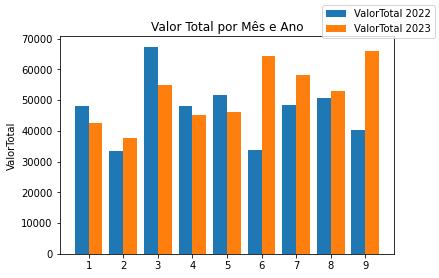

In [0]:
import matplotlib.pyplot as plt
import numpy as np

# Convert the DataFrame to Pandas and sort it
grouped_pd = grouped.toPandas().sort_values(by=['Year', 'Month'])

# Create a figure and an axis
fig, ax = plt.subplots()

# Get the unique years and the number of years
years = grouped_pd['Year'].unique()
num_years = len(years)

# Define the width of the bars and the positions of the x-ticks
width = 0.8 / num_years
x_ticks = np.arange(len(grouped_pd['Month'].unique()))

# Iterate over each unique year
for i, year in enumerate(years):
    # Filter the data for the current year
    data = grouped_pd[grouped_pd['Year'] == year]
    
    # Add a bar plot to the axis for 'ValorTotal' at the correct position
    ax.bar(x_ticks - 0.4 + width/2 + i*width, data['ValorTotal'], width=width, label='ValorTotal ' + str(year))

# Set the x-ticks and x-tick labels
ax.set_xticks(x_ticks)
ax.set_xticklabels(grouped_pd['Month'].unique())

# Set the label for the y-axis
ax.set_ylabel('ValorTotal')

# Set the title of the figure
plt.title("Valor Total por Mês e Ano")

# Show the legend
fig.legend()

# Show the plot
plt.show()

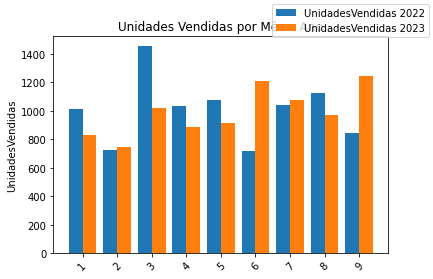

In [0]:
import matplotlib.pyplot as plt
import numpy as np

# Convert the DataFrame to Pandas and sort it
grouped_pd = grouped.toPandas().sort_values(by=['Year', 'Month'])

# Create a figure and an axis
fig, ax = plt.subplots()

# Get the unique years and the number of years
years = grouped_pd['Year'].unique()
num_years = len(years)

# Define the width of the bars and the positions of the x-ticks
width = 0.8 / num_years
x_ticks = np.arange(len(grouped_pd['Month'].unique()))

# Iterate over each unique year
for i, year in enumerate(years):
    # Filter the data for the current year
    data = grouped_pd[grouped_pd['Year'] == year]
    
    # Add a bar plot to the axis for 'UnidadesVendidas' at the correct position
    ax.bar(x_ticks - 0.4 + width/2 + i*width, data['UnidadesVendidas'], width=width, label='UnidadesVendidas ' + str(year))

# Set the x-ticks and x-tick labels
ax.set_xticks(x_ticks)
ax.set_xticklabels(grouped_pd['Month'].unique(), rotation=45)

# Set the label for the y-axis
ax.set_ylabel('UnidadesVendidas')

# Set the title of the figure
plt.title("Unidades Vendidas por Mês e Ano")

# Show the legend
fig.legend()

# Show the plot
plt.show()

In [0]:
from pyspark.sql import functions as F

# Fill null values in 'Promo' column with 0
df_t = df_t.fillna({'Promo': 0})

# Convert 'Promo' column to float, replace NaNs with 0, then convert to integer
df_t = df_t.withColumn('Promo', F.col('Promo').cast('float'))
df_t = df_t.fillna({'Promo': 0})
df_t = df_t.withColumn('Promo', F.col('Promo').cast('int'))

# Extract year and month from 'Data' column
df_t = df_t.withColumn('Year', F.year('Data'))
df_t = df_t.withColumn('Month', F.month('Data'))

# Filter data for year 2022 and create pivot table
df_filtered_2022 = df_t.filter(df_t['Year'] == 2022)
pivot_2022 = df_filtered_2022.groupBy('Month').sum('ValorTotal', 'UnidadesVendidas', 'Promo')

# Filter data for year 2023 and create pivot table
df_filtered_2023 = df_t.filter(df_t['Year'] == 2023)
pivot_2023 = df_filtered_2023.groupBy('Month').sum('ValorTotal', 'UnidadesVendidas', 'Promo')

In [0]:
from pyspark.sql import functions as F

# Fill null values in 'Promo' column with 0
df_t = df_t.fillna({'Promo': 0})

# Convert 'Promo' column to float, replace NaNs with 0, then convert to integer
df_t = df_t.withColumn('Promo', F.col('Promo').cast('float'))
df_t = df_t.fillna({'Promo': 0})
df_t = df_t.withColumn('Promo', F.col('Promo').cast('int'))

# Extract year and month from 'Data' column
df_t = df_t.withColumn('Year', F.year('Data'))
df_t = df_t.withColumn('Month', F.month('Data'))

# Filter data for year 2022 and create pivot table
df_filtered_2022 = df_t.filter(df_t['Year'] == 2022)
pivot_2022 = df_filtered_2022.groupBy('Month').sum('ValorTotal', 'UnidadesVendidas', 'Promo')

# Round values in pivot_2022 to 2 decimal places
for col in pivot_2022.columns:
    pivot_2022 = pivot_2022.withColumn(col, F.round(pivot_2022[col], 2))

# Filter data for year 2023 and create pivot table
df_filtered_2023 = df_t.filter(df_t['Year'] == 2023)
pivot_2023 = df_filtered_2023.groupBy('Month').sum('ValorTotal', 'UnidadesVendidas', 'Promo')

# Round values in pivot_2023 to 2 decimal places
for col in pivot_2023.columns:
    pivot_2023 = pivot_2023.withColumn(col, F.round(pivot_2023[col], 2))

In [0]:

display(pivot_2022 )

Month,sum(ValorTotal),sum(UnidadesVendidas),sum(Promo)
1,48038.68,1014,39
6,33658.65,715,26
3,67336.87,1455,62
5,51761.43,1077,45
9,40119.14,848,35
4,48180.47,1034,37
8,50768.34,1126,59
7,48442.76,1044,48
2,33487.74,725,31


In [0]:
pivot_2022.printSchema()

root
 |-- Month: integer (nullable = true)
 |-- sum(ValorTotal): double (nullable = true)
 |-- sum(UnidadesVendidas): long (nullable = true)
 |-- sum(Promo): long (nullable = true)



In [0]:
from pyspark.sql.functions import col 
pivot_2022 = pivot_2022.withColumnRenamed("sum", "something_else")
from pyspark.sql.functions import sum 
pivot_2022 = pivot_2022.withColumn(
    "Ticket Médio 2022", round(col("sum(ValorTotal)") / col("sum(UnidadesVendidas)"), 2)
)


In [0]:
display(pivot_2022)

Month,sum(ValorTotal),sum(UnidadesVendidas),sum(Promo),Ticket Médio 2022
1,48038.68,1014,39,47.38
6,33658.65,715,26,47.08
3,67336.87,1455,62,46.28
5,51761.43,1077,45,48.06
9,40119.14,848,35,47.31
4,48180.47,1034,37,46.6
8,50768.34,1126,59,45.09
7,48442.76,1044,48,46.4
2,33487.74,725,31,46.19


In [0]:
from pyspark.sql.functions import col

pivot_2022 = pivot_2022.withColumnRenamed("sum(ValorTotal)", "ValorTotal2022") \
                        .withColumnRenamed("sum(UnidadesVendidas)", "UnidadesVendidas2022") \
                        .withColumnRenamed("sum(Promo)", "Promo2022")



In [0]:
pivot_2022.printSchema()

root
 |-- Month: integer (nullable = true)
 |-- ValorTotal2022: double (nullable = true)
 |-- UnidadesVendidas2022: long (nullable = true)
 |-- Promo2022: long (nullable = true)
 |-- Ticket Médio 2022: double (nullable = true)



In [0]:
from pyspark.sql.functions import col 
pivot_2023 = pivot_2023.withColumnRenamed("sum", "something_else")
from pyspark.sql.functions import sum 
pivot_2023 = pivot_2023.withColumn(
    "Ticket Médio 2023",  round(col("sum(ValorTotal)") / col("sum(UnidadesVendidas)"), 2) 
)


pivot_2023 = pivot_2023.withColumnRenamed("sum(ValorTotal)", "ValorTotal2023") \
                        .withColumnRenamed("sum(UnidadesVendidas)", "UnidadesVendidas2023") \
                        .withColumnRenamed("sum(Promo)", "Promo2023")

In [0]:
display(pivot_2023)

Month,ValorTotal2023,UnidadesVendidas2023,Promo2023,Ticket Médio 2023
1,42374.92,829,17,51.12
6,64254.23,1213,16,52.97
3,54805.5,1023,25,53.57
5,46058.31,914,20,50.39
9,65966.08,1246,28,52.94
4,45134.22,886,15,50.94
8,53043.2,968,23,54.8
7,58027.55,1079,23,53.78
2,37752.11,744,28,50.74


In [0]:
display(pivot_2022)

Month,ValorTotal2022,UnidadesVendidas2022,Promo2022,Ticket Médio 2022
1,48038.68,1014,39,47.38
6,33658.65,715,26,47.08
3,67336.87,1455,62,46.28
5,51761.43,1077,45,48.06
9,40119.14,848,35,47.31
4,48180.47,1034,37,46.6
8,50768.34,1126,59,45.09
7,48442.76,1044,48,46.4
2,33487.74,725,31,46.19


In [0]:
# File location and type
file_location = "/FileStore/tables/landing/Produto-1.csv"
file_type = "csv"

# CSV options
infer_schema = "True"
first_row_is_header = "True"
delimiter = ";"

# The applied options are for CSV files. For other file types, these will be ignored.
df_p = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df_p)

ID_Produto,Descri��o Produto,Categoria,Cor,Marca
123000,Bottom Azul Marca AlfaX,Bottom,Azul,AlfaX
123001,Top Cinza Marca GammaZ,Top,Cinza,GammaZ
123002,Bottom Preto Marca BetaY,Bottom,Preto,BetaY
123003,Top Marca BetaY,Top,Vermelho,BetaY
123004,Top Cinza Marca BetaY,Top,Cinza,BetaY
123005,Top Cinza Marca AlfaX,Top,Cinza,AlfaX
123006,Bottom Preto Marca AlfaX,Bottom,Preto,AlfaX
123007,Top Marca AlfaX,Top,Vermelho,AlfaX
123008,Top Marca GammaZ,Top,Vermelho,GammaZ
123009,Top Marca GammaZ,Top,Vermelho,GammaZ


In [0]:
df_p = df_p.withColumnRenamed("Descri��o Produto", "Descrição Produto")


In [0]:
df_p.printSchema()

root
 |-- ID_Produto: integer (nullable = true)
 |-- Descrição Produto: string (nullable = true)
 |-- Categoria: string (nullable = true)
 |-- Cor: string (nullable = true)
 |-- Marca: string (nullable = true)



In [0]:
df_p = df_p.toPandas()

def update_description(row):
    if row['Categoria'] not in row['Descrição Produto']:
        row['Descrição Produto'] = row['Categoria'] + ' ' + row['Descrição Produto']
    if row['Cor'] not in row['Descrição Produto']:
        row['Descrição Produto'] = row['Descrição Produto'].replace(row['Categoria'], row['Categoria'] + ' ' + row['Cor'])
    if 'Marca' not in row['Descrição Produto'] and row['Marca'] not in row['Descrição Produto']:
        row['Descrição Produto'] = row['Descrição Produto'].replace(row['Marca'], 'Marca ' + row['Marca'])
    return row

df_p = df_p.apply(update_description, axis=1)

df_p.loc[df_p['ID_Produto'] == 123010, 'Descrição Produto'] = 'Bottom Azul Marca GammaZ'
df_p.loc[df_p['ID_Produto'] == 123011, 'Descrição Produto'] = 'Bottom Azul Marca BetaY'

In [0]:
from pyspark.sql import SparkSession

spark = SparkSession.builder.getOrCreate()

df_p_spark = spark.createDataFrame(df_p)

df_p_spark.show()

+----------+--------------------+---------+--------+------+
|ID_Produto|   Descrição Produto|Categoria|     Cor| Marca|
+----------+--------------------+---------+--------+------+
|    123000|Bottom Azul Marca...|   Bottom|    Azul| AlfaX|
|    123001|Top Cinza Marca G...|      Top|   Cinza|GammaZ|
|    123002|Bottom Preto Marc...|   Bottom|   Preto| BetaY|
|    123003|Top Vermelho Marc...|      Top|Vermelho| BetaY|
|    123004|Top Cinza Marca B...|      Top|   Cinza| BetaY|
|    123005|Top Cinza Marca A...|      Top|   Cinza| AlfaX|
|    123006|Bottom Preto Marc...|   Bottom|   Preto| AlfaX|
|    123007|Top Vermelho Marc...|      Top|Vermelho| AlfaX|
|    123008|Top Vermelho Marc...|      Top|Vermelho|GammaZ|
|    123009|Top Vermelho Marc...|      Top|Vermelho|GammaZ|
|    123010|Bottom Azul Marca...|   Bottom|    Azul|GammaZ|
|    123011|Bottom Azul Marca...|   Bottom|    Azul| BetaY|
+----------+--------------------+---------+--------+------+



In [0]:
df_p_spark.printSchema()

root
 |-- ID_Produto: long (nullable = true)
 |-- Descrição Produto: string (nullable = true)
 |-- Categoria: string (nullable = true)
 |-- Cor: string (nullable = true)
 |-- Marca: string (nullable = true)



In [0]:
display(df_p_spark)

ID_Produto,Descrição Produto,Categoria,Cor,Marca
123000,Bottom Azul Marca AlfaX,Bottom,Azul,AlfaX
123001,Top Cinza Marca GammaZ,Top,Cinza,GammaZ
123002,Bottom Preto Marca BetaY,Bottom,Preto,BetaY
123003,Top Vermelho Marca BetaY,Top,Vermelho,BetaY
123004,Top Cinza Marca BetaY,Top,Cinza,BetaY
123005,Top Cinza Marca AlfaX,Top,Cinza,AlfaX
123006,Bottom Preto Marca AlfaX,Bottom,Preto,AlfaX
123007,Top Vermelho Marca AlfaX,Top,Vermelho,AlfaX
123008,Top Vermelho Marca GammaZ,Top,Vermelho,GammaZ
123009,Top Vermelho Marca GammaZ,Top,Vermelho,GammaZ


In [0]:
df_t.printSchema()

root
 |-- ID_Trans: integer (nullable = true)
 |-- Data: date (nullable = true)
 |-- ID_Loja: integer (nullable = true)
 |-- ID_Produto: integer (nullable = true)
 |-- ID_Cliente: integer (nullable = true)
 |-- UnidadesVendidas: integer (nullable = true)
 |-- ValorTotal: float (nullable = true)
 |-- Promo: integer (nullable = true)
 |-- Year: integer (nullable = true)
 |-- Month: integer (nullable = true)



In [0]:
df_tp = df_t.join(df_p_spark, on='ID_Produto', how='left')

In [0]:
display(df_tp)

ID_Produto,ID_Trans,Data,ID_Loja,ID_Cliente,UnidadesVendidas,ValorTotal,Promo,Year,Month,Descrição Produto,Categoria,Cor,Marca
123005,1,2022-01-01,7,90023,2,99.98,0,2022,1,Top Cinza Marca AlfaX,Top,Cinza,AlfaX
123004,2,2022-01-01,9,90092,1,35.99,0,2022,1,Top Cinza Marca BetaY,Top,Cinza,BetaY
123001,3,2022-01-01,1,90027,2,51.98,0,2022,1,Top Cinza Marca GammaZ,Top,Cinza,GammaZ
123001,4,2022-01-01,3,90097,2,51.98,0,2022,1,Top Cinza Marca GammaZ,Top,Cinza,GammaZ
123004,5,2022-01-01,4,90089,2,71.98,0,2022,1,Top Cinza Marca BetaY,Top,Cinza,BetaY
123006,6,2022-01-02,4,90021,3,151.17,1,2022,1,Bottom Preto Marca AlfaX,Bottom,Preto,AlfaX
123005,7,2022-01-02,9,90072,4,199.96,0,2022,1,Top Cinza Marca AlfaX,Top,Cinza,AlfaX
123002,8,2022-01-02,1,90006,3,83.97,0,2022,1,Bottom Preto Marca BetaY,Bottom,Preto,BetaY
123002,9,2022-01-03,6,90006,2,55.98,0,2022,1,Bottom Preto Marca BetaY,Bottom,Preto,BetaY
123002,10,2022-01-03,3,90069,1,25.19,0,2022,1,Bottom Preto Marca BetaY,Bottom,Preto,BetaY
